In [4]:
import numpy as np
import h5py
import matplotlib.pylab as plt
import sys
import plotly.express as px
import plotly.offline as py
import plotly.graph_objects as go
import plotly.io as pio
import seaborn as sns
sys.path.append('../../src/')
sys.path.append('/home/gabrielziegler/FastMRIData/fastMRI/')

import fastmri
from fastmri.data import transforms as T
from tqdm import tqdm
from torch.utils.data import DataLoader
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

# custom scripts
import mri_cs
from visualization import plot_batch
from helpers import signal_to_error
# from spiraltrajectory import spiral_samples_trajectory, kspace_measurements_spiral, minimum_energy_reconstruction

layout = go.Layout(template="plotly_dark")
fig = go.Figure(layout=layout)
templated_fig = pio.to_templated(fig)
pio.templates['my_template'] = templated_fig.layout.template
pio.templates.default = 'my_template'
plt.style.use('dark_background')

py.init_notebook_mode()

In [5]:
N = 256
DATA_PATH = '/home/gabrielziegler/FastMRIData/multicoil_challenge/'
FILE_SAMPLE = DATA_PATH + 'file1000072.h5'

hf = h5py.File(FILE_SAMPLE, mode='r')
list(hf.keys())
dict(hf.attrs)

['ismrmrd_header', 'kspace', 'mask']

{'acceleration': 8,
 'acquisition': 'CORPD_FBK',
 'num_low_frequency': 15,
 'patient_id': '18cbf73ca94709786e82b52b27e9e3f39bd2391b4f77f4ecd83d591079bc8063'}

# Number of slices x number of coils x height x width

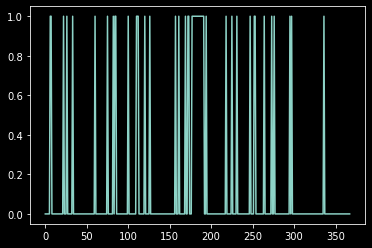

In [19]:
plt.plot(hf['mask'][()])

In [6]:
volume_kspace = hf['kspace'][()]
volume_kspace.shape
volume_kspace.dtype

(37, 15, 640, 368)

dtype('complex64')

# 20-th slice of this volume

In [45]:
slice_kspace = volume_kspace[20]
slice_kspace.shape

(15, 640, 368)

In [46]:
def show_coils(data, slice_nums, cmap=None):
    fig = plt.figure()
    for i, num in enumerate(slice_nums):
        plt.subplot(1, len(slice_nums), i + 1)
        plt.imshow(data[num], cmap=cmap)

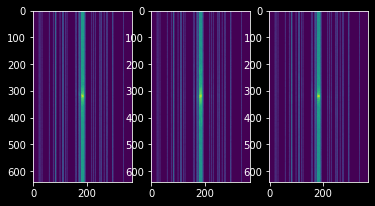

In [47]:
show_coils(np.log(np.abs(slice_kspace) + 1e-9), [0, 5, 10])  # This shows coils 0, 5 and 10

In [71]:
slice_kspace.shape
from scipy.io import savemat

D = {"x": slice_kspace}

savemat("/home/gabrielziegler/matlab-fastmri.mat", D)

(15, 640, 368)

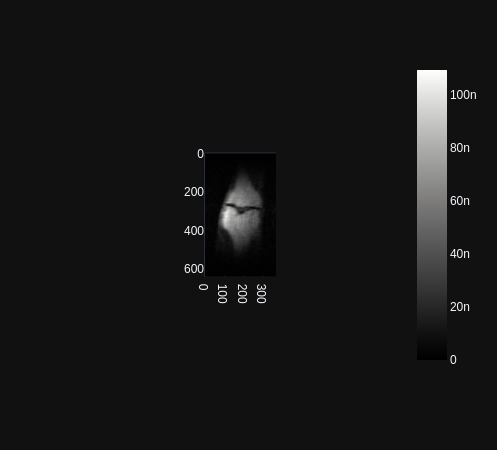

In [79]:
# for i in range(5):
i = 9
#     slice_kspace[i].shape
test = slice_kspace[i]
test = np.fft.ifftshift(test)
test = np.fft.ifft2(test)
test = np.abs(test)
test = np.fft.fftshift(test)
px.imshow(test, color_continuous_scale='gray')

In [49]:
slice_kspace2 = T.to_tensor(slice_kspace)      # Convert from numpy array to pytorch tensor
slice_image = fastmri.ifft2c(slice_kspace2)           # Apply Inverse Fourier Transform to get the complex image
slice_image_abs = fastmri.complex_abs(slice_image)

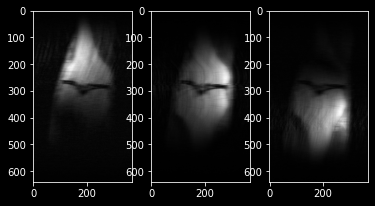

In [50]:
show_coils(slice_image_abs, [0, 5, 10], cmap='gray')

In [81]:
slice_image_abs.shape

torch.Size([15, 640, 368])

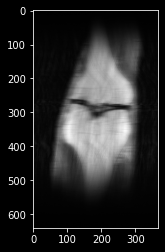

In [51]:
slice_image_rss = fastmri.rss(slice_image_abs, dim=0)
plt.imshow(np.abs(slice_image_rss.numpy()), cmap='gray')

In [22]:
from fastmri.data.subsample import RandomMaskFunc
mask_func = RandomMaskFunc(center_fractions=[0.04], accelerations=[8])  # Create the mask function object

In [23]:
masked_kspace, mask = T.apply_mask(slice_kspace2, mask_func)   # Apply the mask to k-space

In [24]:
sampled_image = fastmri.ifft2c(masked_kspace)           # Apply Inverse Fourier Transform to get the complex image
sampled_image_abs = fastmri.complex_abs(sampled_image)   # Compute absolute value to get a real image
sampled_image_rss = fastmri.rss(sampled_image_abs, dim=0)

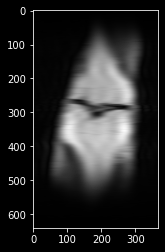

In [25]:
plt.imshow(np.abs(sampled_image_rss.numpy()), cmap='gray')